In [26]:
# Importing all packages

from PIL import Image
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [27]:
# Mouting drive for loading images

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [28]:
!pip install pyzbar
import pyzbar


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [29]:
!apt-get install libzbar0

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libzbar0 is already the newest version (0.23-1.3).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


In [30]:
import pyzbar.pyzbar as pyzbar

Barcode: 8901719112737
Count: 1
--------------------
Barcode: http://everestspices.com/?ref=qr
Count: 1
--------------------
Barcode: 8901030656026
Count: 1
--------------------
Barcode: http://qr.w69b.com/g/ogRXOfCg0
Count: 1
--------------------
Barcode: 8901030574252
Count: 1
--------------------
Total No of barcodes detected:  5


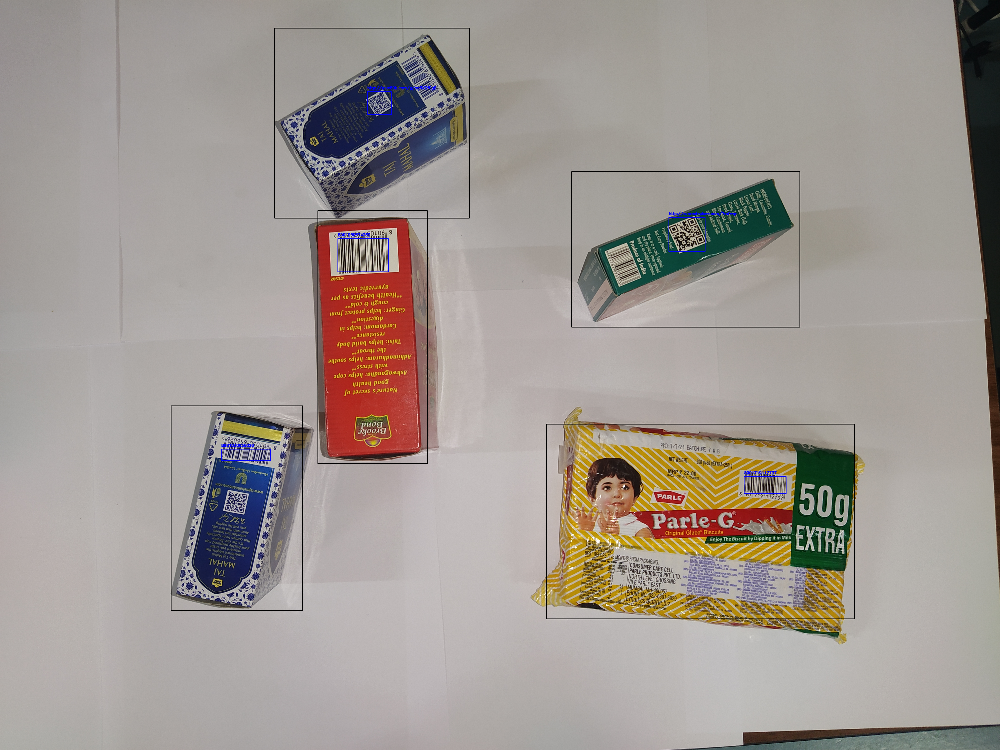

In [34]:
import torch
import torchvision
import torchvision.transforms as T
import numpy as np
import cv2
from pyzbar import pyzbar

# Load the pre-trained model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

# Load the image
image = cv2.imread('/content/drive/My Drive/Mowtio Project/sample/all barcode/IMG_20220303_173611.jpg')

# Preprocess the input
transform = T.Compose([T.ToTensor()])
input_tensor = transform(image)
input_tensor = input_tensor.unsqueeze(0)

# Forward pass through the model
with torch.no_grad():
    predictions = model(input_tensor)

# Extract bounding box coordinates, labels, and scores
boxes = predictions[0]['boxes'].detach().numpy()
labels = predictions[0]['labels'].detach().numpy()
scores = predictions[0]['scores'].detach().numpy()

# Apply Non-Maximum Suppression (NMS) for overlapping boxes and confidence threshold for low probability objects to get final indices of ROI
confidence_threshold = 0.12
nms_threshold = 0.6
indices = cv2.dnn.NMSBoxes(boxes, scores, confidence_threshold, nms_threshold)

#counter for total number of barcodes
ctr = 0
# list to store boxes that don't have a barcode detected
no_barcode_boxes = []
# dictionary for storing every barcode value and its count
barcode_counts = {}

# Loop over the filtered bounding boxes
for i in indices.flatten():
    box = boxes[i]
    label = labels[i]
    score = scores[i]

    x, y, w, h = box.astype(int)

    # Draw bounding box on the image for barcodes
    cv2.rectangle(image, (x, y), (w, h), (0, 0, 0), 2)

    # Crop the region of interest for barcode detection
    roi = image[y:h, x:w]

    # performing scaling operation
    scale = 4
    width = int(roi.shape[1] * scale)
    height = int(roi.shape[0] * scale)
    roi = cv2.resize(roi, (width, height))

    # Convert the region of interest to grayscale
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)

    # applying thresholding 
    ret, bw_im = cv2.threshold(gray, 107, 255, cv2.THRESH_BINARY)

    # Decode barcodes
    barcodes = pyzbar.decode(bw_im)

    if len(barcodes) == 0:
        no_barcode_boxes.append(box)

    ctr += len(barcodes)

    

    # Loop over the detected barcodes
    for barcode in barcodes:
        # Extract barcode data and bounding box coordinates
        barcode_data = barcode.data.decode("utf-8")

        if barcode_data in barcode_counts:
            barcode_counts[barcode_data] += 1
        else:
            barcode_counts[barcode_data] = 1


        (x_bar, y_bar, w_bar, h_bar) = barcode.rect

        # Scale the barcode bounding box coordinates to the original image size
        x_bar_orig = x + int(x_bar / 4)
        y_bar_orig = y + int(y_bar / 4)
        w_bar_orig = int(w_bar / 4)
        h_bar_orig = int(h_bar / 4)

        # Draw bounding box around barcode in the original image
        cv2.rectangle(image, (x_bar_orig, y_bar_orig), (x_bar_orig + w_bar_orig, y_bar_orig + h_bar_orig), (255, 0, 0), 2)

        # Display barcode data as text
        cv2.putText(image, barcode_data, (x_bar_orig, y_bar_orig - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0, 0), 2)

# Draw bounding boxes of red color for items without barcodes
for box in no_barcode_boxes:
    x, y, w, h = box.astype(int)
    cv2.rectangle(image, (x, y), (w, h), (0, 0, 255), 2)
    
# Print every barcode value and its count in the image
for barcode_data, count in barcode_counts.items():
    print("Barcode:", barcode_data)
    print("Count:", count)
    print("--------------------")

# print the total no of barcodes detected
print("Total No of barcodes detected: ", ctr)

# Display the image with bounding boxes and barcode data
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()
